# cloud inpainting and removal using Pix2PixHD and stepwise local radiometric adjustment algorithm

> * 🔬 Data Science
> * 🥠 Deep Learning and image translation

## Table of Contents

* [Introduction](#Introduction)
* [Necessary imports](#Necessary-imports)
* [Connect to your GIS](#Connect-to-your-GIS)
* [Export training data](#Export-training-data)
* [Prepare the data](#Prepare-the-data)
* [Train cloud pixel generation model](#Train-cloud-pixel-generation-model)
  * [Load Pix2PixHD model architecture](#Load-UNet-model-architecture)
  * [Tune for optimal learning rate](#Tune-for-optimal-learning-rate)
  * [Fit the model](#Fit-the-model)
  * [Visualize results](#Visualize-results)
  * [Save the model](#Save-the-model)
* [Model inferencing](#Model-inferencing)
  * [Generate cloud pixels utilizing the Classify Pixels Using Deep Learning tool](#Generate-cloud-pixels-utilizing-the-Classify-Pixels-Using-Deep-Learning-tool)
* [Generate cloud mask](#Generate-cloud-mask)
  * [Use sentinel2 cloud detector](#Use-sentinel2-cloud-detector)
* [Blend generated cloud pixels using stepwise local radiometric adjustment raster function](#Blend-generated-cloud-pixels-using-stepwise-local-radiometric-adjustment-raster-function)
* [Conclusion](#Conclusion)
* [References](#References)

# Introduction

The goal of this notebook, is to recover the cloudless feature information from satellite images contaminated by
clouds. In a general perspective, it can be seen as a image denoising problem, in which clouds are considered as noise in respect to land surface in images. 

The notebook, we demonstrates a novel way of combining deep learning model available in [arcgis.learn](https://developers.arcgis.com/python/api-reference/arcgis.learn.toc.html) and image processing technique available in [raster functions](https://github.com/Esri/raster-functions) to remove clouds from satellite imagery. 

## Necessary imports

In [2]:
import os, zipfile
from pathlib import Path
from os import listdir
from os.path import isfile, join
from osgeo import gdal
import numpy as np
from s2cloudless import S2PixelCloudDetector
import matplotlib.pyplot as plt

from arcgis import GIS
from arcgis.learn import prepare_data, Pix2PixHD

## Connect to your GIS

In [2]:
gis = GIS('Home')
ent_gis = GIS('https://deldev.maps.arcgis.com', 'arcgis_python', 'amazing_arcgis_123')

## Export training data

For this scenario, we have a pair of sentinel 2 imagery i.e. cloud covered and cloud free, for same geographical area. We will export this data in the “Export Tiles” metadata format available in the `Export Training Data For Deep Learning` tool. The tool is available in [ArcGIS Pro](https://www.esri.com/en-us/arcgis/products/arcgis-pro/overview) and [ArcGIS Image Server](https://www.esri.com/en-us/arcgis/products/arcgis-image-server).

Near infrared and shortwave infrared bands of sentinel-2 have capablity to penetrate cloud to some extent. The Pix2PixHD model learns to generate or simulate pixels of cloud covered regions using the information available through various spectral bands. 

- `Input Raster`: cloud covered imagery
- `Additional Input raster`: cloud free imagery
- `Tile Size X & Tile Size Y`: 256
- `Stride X & Stride Y`: 128
- `Meta Data Format`: 'Export Tiles' as we are training a image translation model.
- `Environments`: Set optimum `Cell Size`, `Processing Extent`.

The rasters used for exporting the training dataset are provided below:

<Item title:"raster_with_clouds" type:Imagery Layer owner:demos_deldev>
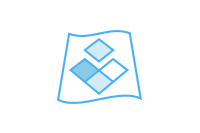

In [4]:
cloud_covered = ent_gis.content.get('57ff09fd968540628bee5da1c2af4fb4')
cloud_covered

<Item title:"raster_no_clouds" type:Imagery Layer owner:demos_deldev>
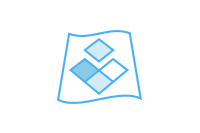

In [5]:
cloud_free = ent_gis.content.get('61cefec05ddf43e7b0b2a06a80751dae')
cloud_free

<div style="align: left; text-align:center; line-height: 5em"> 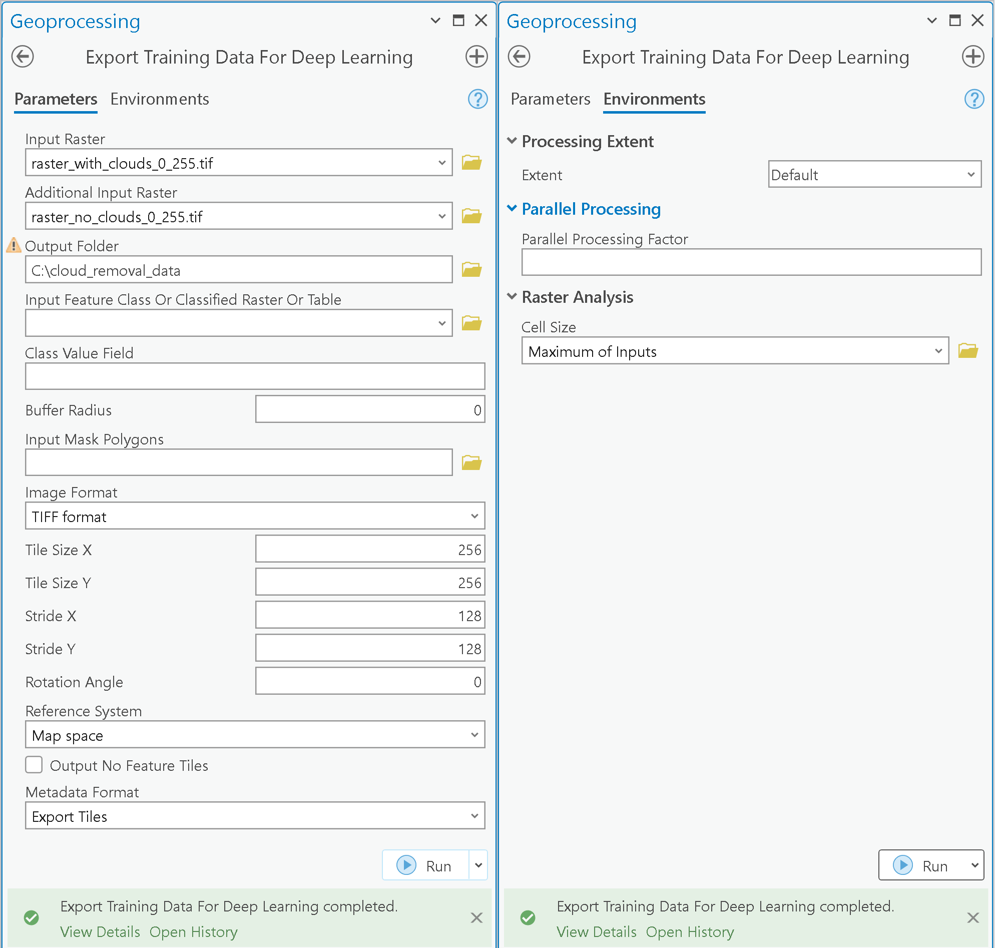 <div class="caption"> Export Training Data for Deep Learning tool</div> </div> 

## Prepare the data

Alternatively, we have also provided a subset of training data containing a few samples with the rasters used for exporting the training dataset. You may use the data directly to carry out the experiments.

<Item title:"cloud removal dataset" type:Image Collection owner:demos_deldev>
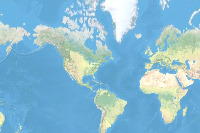

In [7]:
training_data = ent_gis.content.get('edbce138ae4f4adcbc39b21bc6af3168')
training_data

In [8]:
filepath = training_data.download(file_name=training_data.name)

In [10]:
#Extract the data from the zipped image collection
with zipfile.ZipFile(filepath, 'r') as zip_ref:
    zip_ref.extractall(Path(filepath).parent)

In [3]:
data=prepare_data(path=filepath, batch_size=10)

In [4]:
data

DataBunch;

Train: Pix2PixHDDataset(torch.Size([10, 256, 256]), torch.Size([10, 256, 256])), items_A:999, items_B:999;

Valid: Pix2PixHDDataset(torch.Size([10, 256, 256]), torch.Size([10, 256, 256])), items_A:111, items_B:111;

Test: None

### Visualize a few samples from your training data

To get a better sense of the training data, we will use the `show_batch()` method in `arcgis.learn`. This method randomly picks a few training chips, overlayed by their respective labels, and visualizes them.

- `alpha`: Opacity of overlayed labels over the training chips

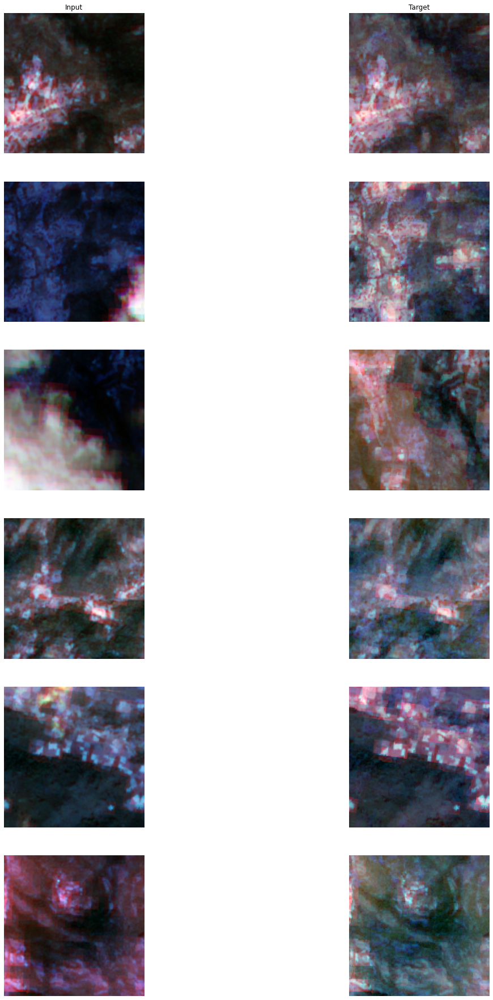

In [4]:
data.show_batch(rows=6)

## Train cloud pixel generation model

### Load Pix2PixHD model architecture

In [5]:
model = Pix2PixHD(data, n_blocks_global=22, n_layers_dscr=9)

### Tune for optimal learning rate

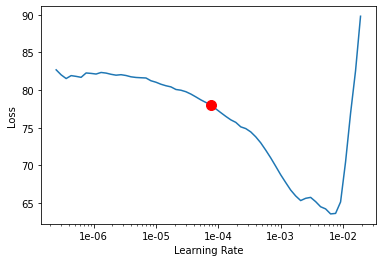

In [6]:
lr = model.lr_find()

### Fit the model

To train the model, we use the `fit()` method. To start, we will train our model for 10 epochs. The number of epochs defines how many times a model will be exposed to the entire training set.

- `epochs`: Number of cycles of training on the data.
- `lr`: Learning rate to be used for training the model.

In [7]:
model.fit(10, lr, tensorboard=True)

Monitor training on Tensorboard using the following command: 'tensorboard --host=DELDEVD037 --logdir="C:\Esri_project\cloud_masking_algo\data\training_log"'


epoch,train_loss,valid_loss,gen_loss,disc_fake_loss,disc_real_loss,feat_loss,l1_loss,time
0,67.459969,57.344303,1.146256,0.864929,0.852672,17.913357,48.400360,04:26
1,45.690495,37.311504,1.179295,0.376987,0.450785,13.863604,30.647612,04:16
2,38.268143,31.610065,1.486023,0.483895,0.282622,11.795263,24.986855,04:16
3,34.506119,30.440357,1.449892,0.249013,0.241674,10.888886,22.167332,04:16
4,33.403774,28.256895,1.506730,0.153853,0.257104,10.889068,21.007982,04:33
5,32.137810,25.852268,1.543108,0.280289,0.157211,11.271912,19.322783,04:24
6,30.978765,26.725899,1.624089,0.214248,0.217988,11.541557,17.813126,04:19
7,30.248310,28.669479,1.592426,0.140758,0.172832,11.526703,17.129183,04:16
8,29.466221,26.697720,1.685245,0.107301,0.127072,11.289465,16.491518,04:17
9,28.698833,26.768795,1.738070,0.074811,0.158581,11.143031,15.817741,04:17


Here, only 10 epochs are shown as demonsration. The actual model is trained for around 350 epochs till we see improvement. Model performance is monitored using the tensorboard.

### Visualize results

It is a good practice to visualize the results obtained from the model with the actual ground truth data. The `show_results` function picks random samples, and visualizes the ground truth and model predictions side by side. This enables us to preview the results of the model within the notebook.

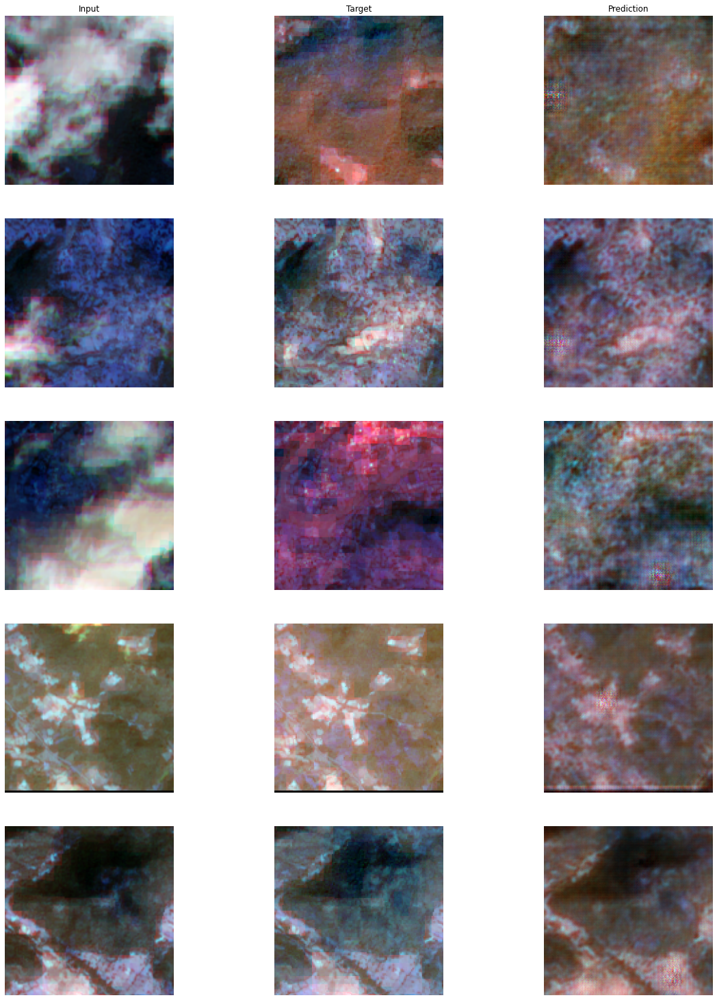

In [8]:
model.show_results(rows=5)

### Save the model

We will save the model that we trained as a 'Deep Learning Package' ('.dlpk' format). A Deep Learning package is the standard format used to deploy deep learning models on the ArcGIS platform.

We will use the `save()` method to save the trained model. By default, it will be saved to a sub-folder inside the training data folder with the name "models".

In [ ]:
model.save(r'pix2pixhd_cloud_pixel_generation_e400')

### Compute model metrics

In [ ]:
model.compute_metrics()

## Model inferencing

### Generate cloud pixels utilizing the Classify Pixels Using Deep Learning tool

After training the cloud pixels generation model and saving the weights, we can use the `Classify Pixels Using Deep Learning` tool, available in both [ArcGIS Pro](https://www.esri.com/en-us/arcgis/products/arcgis-pro/overview) and [ArcGIS Enterprise](https://www.esri.com/en-us/arcgis/products/arcgis-enterprise/overview), for inferencing at scale. 

Only a part of the given training raster is used for training, the remaining part is used to test the model. We try out the complete workflow on the whole raster.

<div style="align: left; text-align:center; line-height: 5em"> 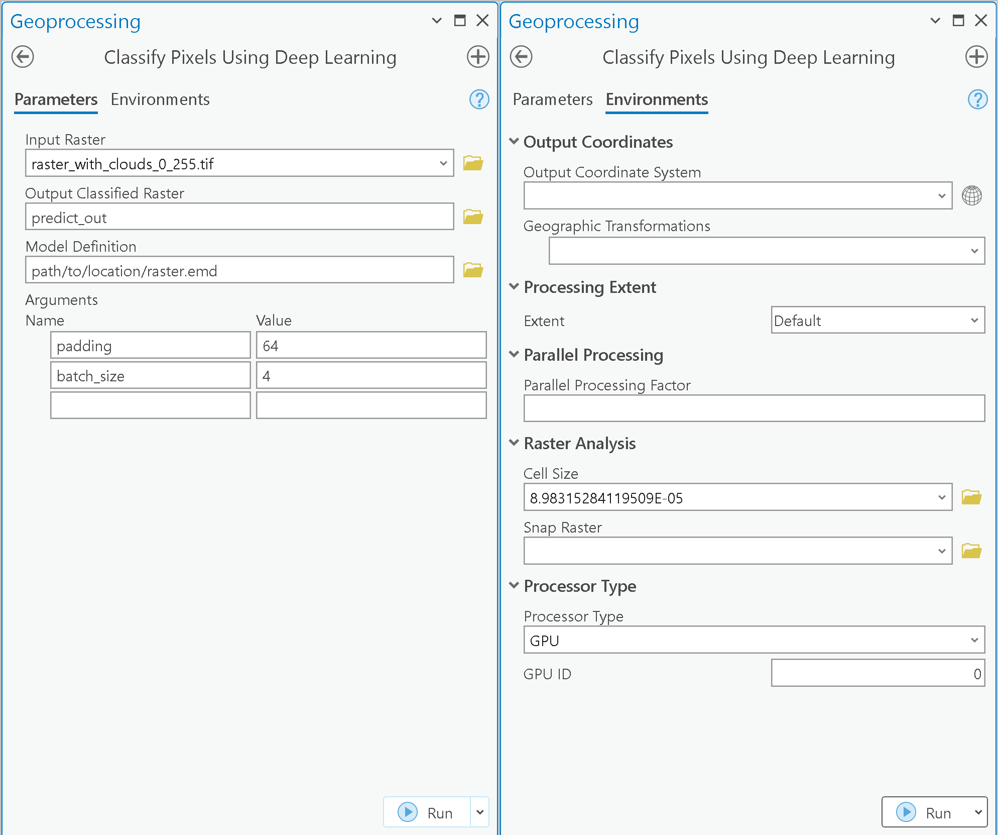 <div class="caption"> Classify Pixels Using Deep Learning tool</div> </div> 

In [ ]:
with arcpy.EnvManager(cellSize=0.0002694460214, processorType='GPU', gpuId = '0'):
    out_classified_raster = arcpy.ia.ClassifyPixelsUsingDeepLearning("Input_raster_with_clouds.tif", r"path\to\location\model.emd", "padding 56;batch_size 4;predict_background True;tile_size 256")
    out_classified_raster.save(r"path\to\out_put\predicted_cloudless.tif")`

## Generate cloud mask

### Use sentinel2 cloud detector

We use the sentinel 2 cloud detector to get a cloud mask for our raster. The cloud mask is used to locate and replace the pixels covered with clouds.

In [3]:
img = gdal.Open(r"path\to\location\raster.tif")
arr =  np.transpose(img.ReadAsArray(),(1,2,0))/10000

cloud_detector = S2PixelCloudDetector(threshold=0.4, average_over=4, dilation_size=2, all_bands=False)
cloud_mask = cloud_detector.get_cloud_masks(arr)

In [4]:
from osgeo import gdal_array

ds = gdal_array.SaveArray(cloud_mask, r"path\to\saving\location\cloud_mask.tif","GTiff", img)
ds = None
os.rename(r"path\to\saving\location\cloud_mask.tif", r"path\to\saving\location\cloud_mask_2.tif")

### Visualize the generated cloud mask

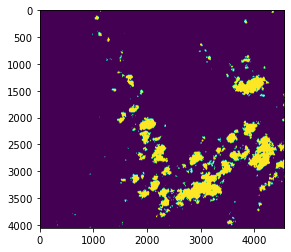

In [23]:
plt.imshow(cloud_mask)
plt.show()

## Blend generated cloud pixels using stepwise local radiometric adjustment raster function

This Python raster function is for blending areas using Stepwise Local Radiometric Adjustment algorithm. The stepwise local radiometric adjustment is undertaken to fill contaminated areas and is conducted on each mask region of the target image. This tool replaces those pixels which are covered with clouds using the replacement raster. 

The raster functions can be downloaded from [raster-functions](https://github.com/Esri/raster-functions), available inside the functions folder. StepwiseLocalRadiometricAdjustment.py can be opened using `Open Python Raster function` in pane. Then, it is saved using `Save As`.

- `Input Raster`: cloud covered imagery
- `Input Replacement raster`: pix2pixhd generated raster is provided as replacement raster
- `Input Mask`: generated cloud mask
- `Size of Window`: 80
- `Buffer Mask`: any value between 0-15, accordiong to coverage of cloud mask

<div style="align: left; text-align:center; line-height: 5em">  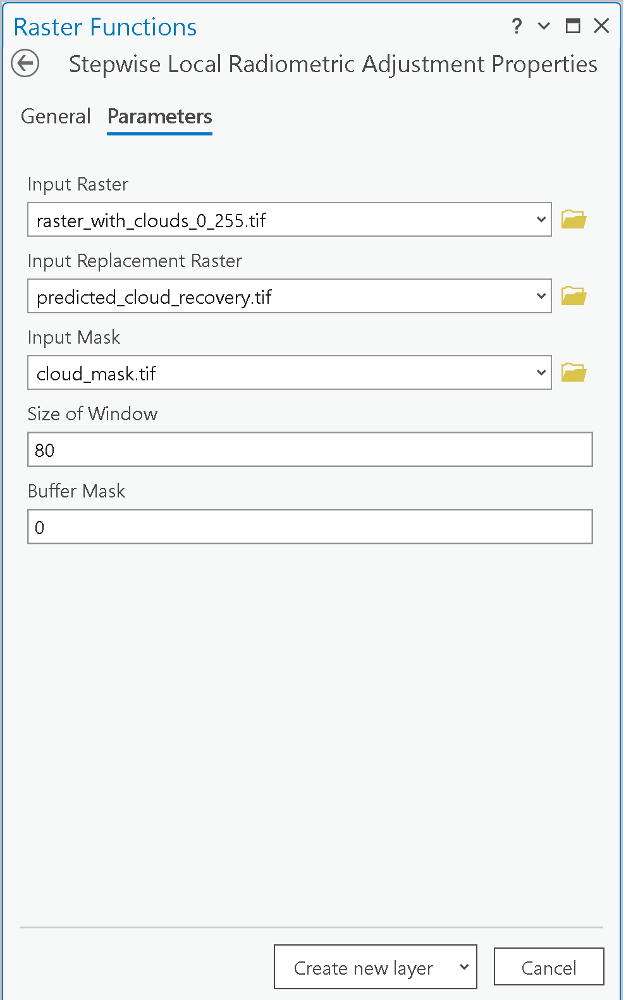 <div class="caption"> Stepwise Local Radiometric Adjustment Raster Function </div> </div>

The saved raster function is exported as rft(raster function template). rft is used in `Generate Raster From Raster Function` tool to get the final results as this tool is designed for raster processing using multiple threads to help speed up the processing.

`arcpy.management.GenerateRasterFromRasterFunction(r"path\to\the\rft_location\Stepwise Local Radiometric Adjustment.rft.xml", r"path\to\output\location", None, None, "TIFF", "CURRENT_SLICE")`

<div style="align: left; text-align:center; line-height: 5em"> 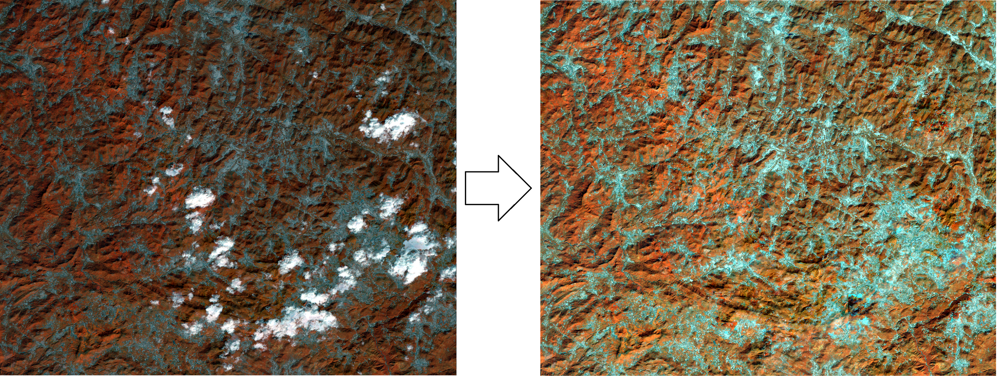 <div class="caption"> Final results of the workflow </div> </div> 

## Conclusion

In this notebook, we demonstrated how to use the image translational models, i.e. Pix2PixHD, available in `arcgis.learn` and stepwise local radiometric adjustment to remove clouds in cloud contaminated imagery.

## References

[1] Olaf Ronneberger, Philipp Fischer, Thomas Brox: U-Net: Convolutional Networks for Biomedical Image Segmentation, 2015;[arXiv:1505.04597](https://arxiv.org/abs/1505.04597) 